# 데이터 불러오기

In [1]:
!wget -P ./ -q https://raw.githubusercontent.com/kangmg/Abalone_age_prediction/main/dataset/sample_submission.csv
!wget -P ./ -q https://raw.githubusercontent.com/kangmg/Abalone_age_prediction/main/dataset/train.csv
!wget -P ./ -q https://raw.githubusercontent.com/kangmg/Abalone_age_prediction/main/dataset/test.csv
!wget -P ./ -q https://raw.githubusercontent.com/kangmg/Abalone_age_prediction/main/dataset/Original.csv

In [2]:
!pip install -q catboost
!pip install -q optuna
!pip install scikit-learn==1.4.1.post1
!pip install -q pycaret
!pip install --upgrade -q xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.8/78.8 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 25.1 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.2/486.2 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.0/258.0 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.6 MB/s eta 0:00:00
     ━━━━━━━

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_log_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import make_scorer
import missingno as msno
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import KFold
from sklearn.ensemble import VotingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
import optuna
from optuna import Trial
from optuna.samplers import TPESampler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import accuracy_score
from pycaret.regression import *
import string

In [4]:
# data 불러오기
train = pd.read_csv("train.csv", index_col="id")
test_df = pd.read_csv("test.csv", index_col="id")
submission = pd.read_csv("sample_submission.csv")
original = pd.read_csv("Original.csv", index_col="id")

In [5]:
train.shape, test_df.shape, submission.shape, original.shape

((90615, 9), (60411, 8), (60411, 2), (4177, 9))

In [6]:
# 샘플값 확인
'''
- 독립변수
    - Sex   : 전복 성별 F(여성), M(남성) , I(아이) - 범주형
    - Length  : 전복 길이 - 연속형
    - Diameter  : 전복 둘레 - 연속형
    - Height : 전복 키 - 연속형
    - Whole Weight :  전복 전체 무게
    - Whole Weight.1(Shucked Weight) : 껍질을 제외한 무게 - 연속형
    - Whole Weight.2(Viscra Weight) : 내장 무게 - 연속형
    - Shell Weight : 껍질 무게
- 종속변수(타겟)
    - Rings : 전복 나이
'''
train.head()

,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings
id,,,,,,,,,
0,F,0.550,0.430,0.150,0.7715,0.3285,0.1465,0.2400,11
1,F,0.630,0.490,0.145,1.1300,0.4580,0.2765,0.3200,11
2,I,0.160,0.110,0.025,0.0210,0.0055,0.0030,0.0050,6
3,M,0.595,0.475,0.150,0.9145,0.3755,0.2055,0.2500,10
4,I,0.555,0.425,0.130,0.7820,0.3695,0.1600,0.1975,9


In [7]:
original.head()

,Sex,Length,Diameter,Height,Whole_weight,Shucked_weight,Viscera_weight,Shell_weight,Rings
id,,,,,,,,,
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [8]:
test_df.head()

,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight
id,,,,,,,,
90615,M,0.645,0.475,0.155,1.2380,0.6185,0.3125,0.3005
90616,M,0.580,0.460,0.160,0.9830,0.4785,0.2195,0.2750
90617,M,0.560,0.420,0.140,0.8395,0.3525,0.1845,0.2405
90618,M,0.570,0.490,0.145,0.8740,0.3525,0.1865,0.2350
90619,I,0.415,0.325,0.110,0.3580,0.1575,0.0670,0.1050


In [9]:
# train랑 original 피처명 다름 ->train의 피처명로 고정
original.columns = ['Sex','Length','Diameter','Height','Whole weight','Whole weight.1','Whole weight.2','Shell weight','Rings']

In [10]:
# train와 original를 concat을 활용하여 합치기
train_df = pd.concat([train, original], ignore_index=True)

# 결과 확인
train_df

,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings
0,F,0.550,0.430,0.150,0.7715,0.3285,0.1465,0.2400,11
1,F,0.630,0.490,0.145,1.1300,0.4580,0.2765,0.3200,11
2,I,0.160,0.110,0.025,0.0210,0.0055,0.0030,0.0050,6
3,M,0.595,0.475,0.150,0.9145,0.3755,0.2055,0.2500,10
4,I,0.555,0.425,0.130,0.7820,0.3695,0.1600,0.1975,9
...,...,...,...,...,...,...,...,...,...
94787,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
94788,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
94789,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
94790,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


# EDA

In [11]:
# df_train 요약 테이블
def summary(df):
    summary = pd.DataFrame(df.dtypes, columns = ['type'])
    summary['Null'] = df.isnull().sum().values
    summary['unique'] = df.nunique().values
    summary['sample_0'] = df.iloc[0].values
    summary['sample_1'] = df.iloc[1].values
    summary['sample_2'] = df.iloc[2].values

    data_type = 'dtype'
    summary[data_type] = None
    for col in df.columns:
        if train[col].dtypes == 'float':
            summary.loc[col, data_type] = '연속형'
        elif train[col].dtypes == 'object':
            summary.loc[col, data_type] = '명목형'
        else:
            summary.loc[col, data_type] = '순서형'

    return summary

def summary_index_reset(summary):
    summary.reset_index(inplace=True)
    summary.rename(columns={'index' : 'feature'}, inplace=True)
    return summary

summary_train_df = summary_index_reset(summary(train_df))
summary_train_df

,feature,type,Null,unique,sample_0,sample_1,sample_2,dtype
0,Sex,object,0,3,F,F,I,명목형
1,Length,float64,0,157,0.55,0.63,0.16,연속형
2,Diameter,float64,0,126,0.43,0.49,0.11,연속형
3,Height,float64,0,90,0.15,0.145,0.025,연속형
4,Whole weight,float64,0,3205,0.7715,1.13,0.021,연속형
5,Whole weight.1,float64,0,1806,0.3285,0.458,0.0055,연속형
6,Whole weight.2,float64,0,983,0.1465,0.2765,0.003,연속형
7,Shell weight,float64,0,1132,0.24,0.32,0.005,연속형
8,Rings,int64,0,28,11,11,6,순서형


In [12]:
# train_df 데이터 사본 생성
train = train_df.copy()

<Axes: xlabel='Rings', ylabel='count'>

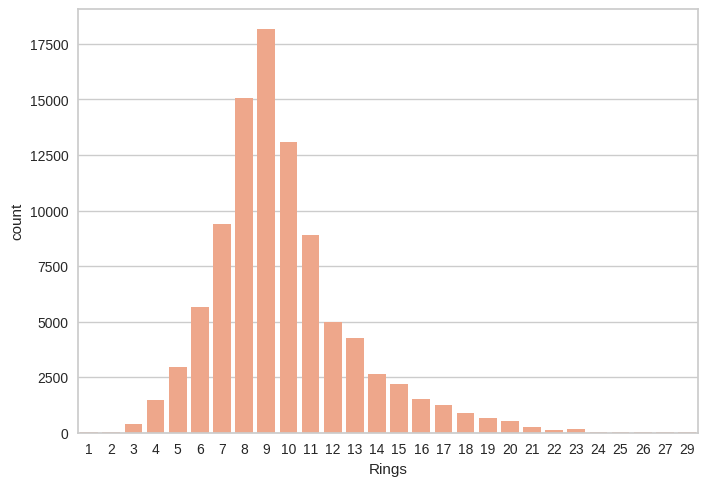

In [13]:
# target distribution
target_dist = train.Rings.value_counts()
sns.barplot(target_dist, color="lightsalmon") # 28은 없음

### Pre-processing

<Axes: xlabel='Value', ylabel='Feature'>

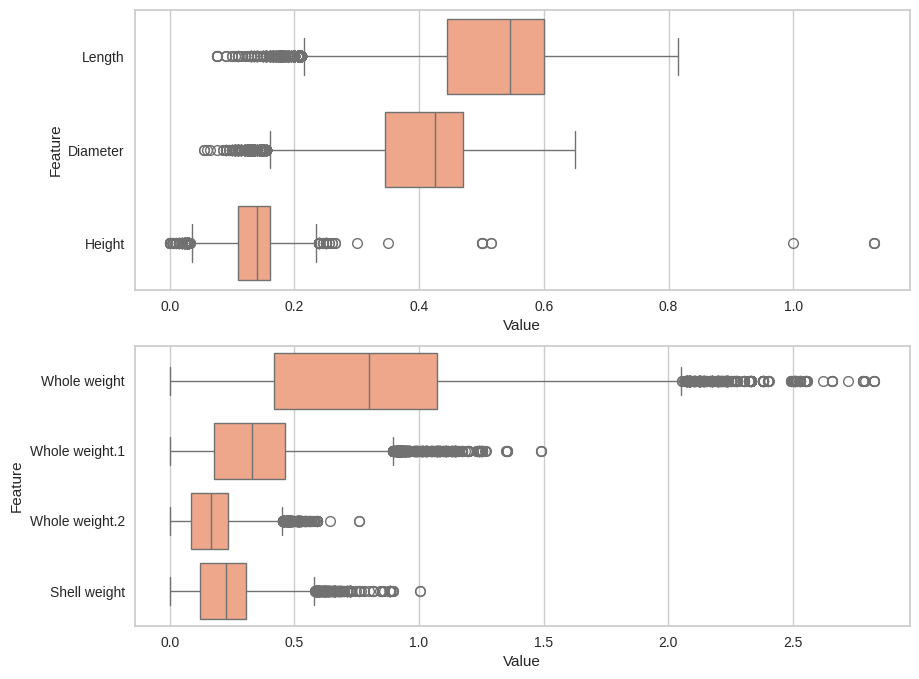

<Figure size 1000x400 with 0 Axes>

In [14]:
length_data = pd.melt(train.drop(columns=["Rings", "Sex", "Whole weight", "Whole weight.2", "Whole weight.1", "Shell weight"]), var_name="Feature", value_name="Value")
weight_data = pd.melt(train.drop(columns=["Rings", "Sex", "Length", "Diameter", "Height"]), var_name="Feature", value_name="Value")

# boxplot을 그립니다.
fig, axs = plt.subplots(2,1,figsize=(10, 8) )
plt.figure(figsize=(10, 4))
sns.boxplot(x="Value", y="Feature", data=length_data, ax=axs[0], color="lightsalmon")
sns.boxplot(x="Value", y="Feature", data=weight_data, ax=axs[1], color="lightsalmon")

In [15]:
### outlier 두개 제거 여부

remove_two_outlier = True
# true --> 값 두개제거


train = train.loc[train.Height < 0.4] if remove_two_outlier else train

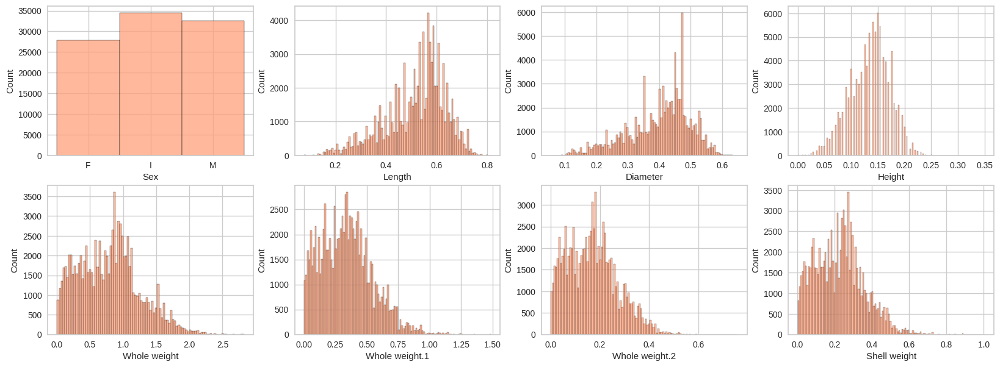

In [16]:
fig, axs = plt.subplots(2,4, figsize=(20, 7))
for idx, feature in enumerate(feature for feature in train.columns if feature != "Rings"):
  sns.histplot(train[feature], ax=axs[idx//4, idx%4], color="lightsalmon")

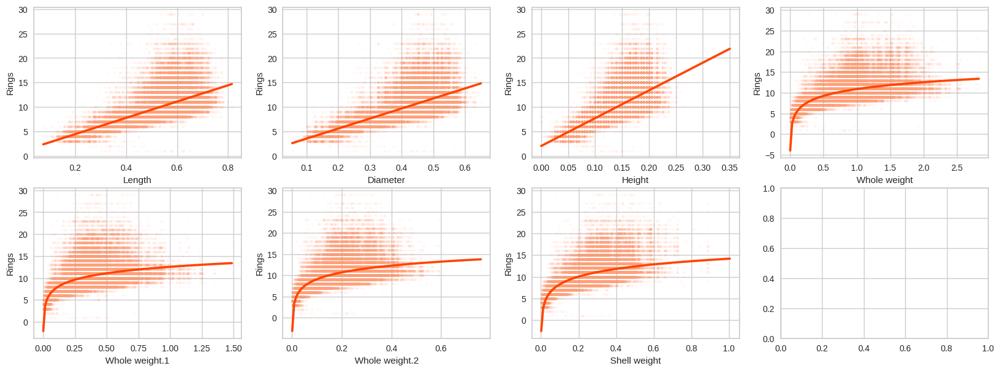

In [17]:
log_plot = [False, False, False, True, True, True, True]
fig, axs = plt.subplots(2,4, figsize=(20, 7))
for idx, feature in enumerate(feature for feature in train.columns if feature not in ["Rings", "Sex"]):
  sns.regplot(data=train, x=feature, y="Rings", scatter_kws={"alpha":0.05, "s":10}, ax=axs[idx//4, idx%4], color="lightsalmon", logx=log_plot[idx], line_kws={"color":"orangered"})

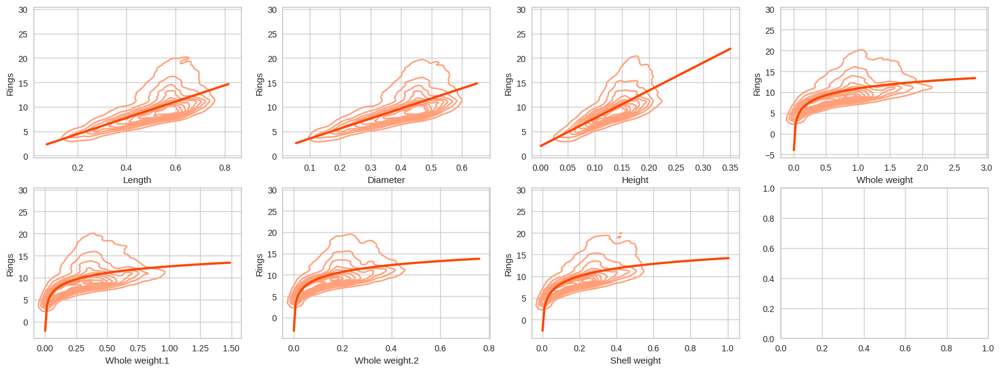

In [18]:
log_plot = [False, False, False, True, True, True, True]
fig, axs = plt.subplots(2,4, figsize=(20, 7))
for idx, feature in enumerate(feature for feature in train.columns if feature not in ["Rings", "Sex"]):
  sns.kdeplot(data=train, x=feature, y="Rings", ax=axs[idx//4, idx%4], color="lightsalmon")
  sns.regplot(data=train, x=feature, y="Rings", ax=axs[idx//4, idx%4], logx=log_plot[idx], scatter=False, line_kws={"color":"orangered"})

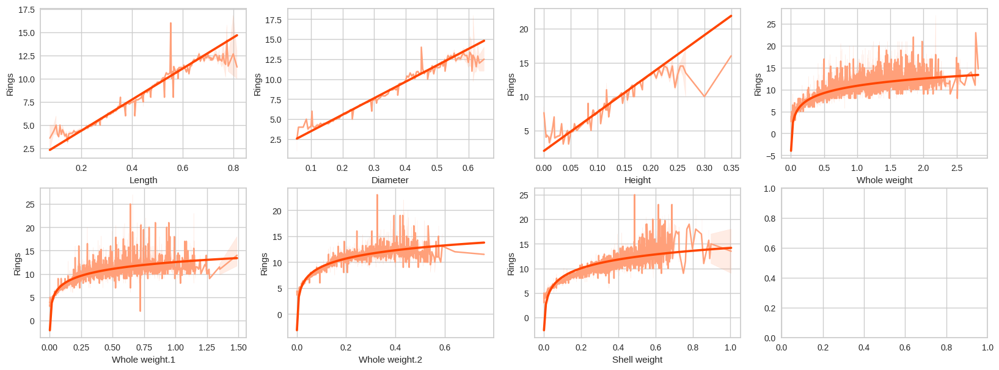

In [19]:
log_plot = [False, False, False, True, True, True, True]
fig, axs = plt.subplots(2,4, figsize=(20, 7))
for idx, feature in enumerate(feature for feature in train.columns if feature not in ["Rings", "Sex"]):
  sns.lineplot(data=train, x=feature, y="Rings", ax=axs[idx//4, idx%4], color="lightsalmon")
  sns.regplot(data=train, x=feature, y="Rings", scatter=False, ax=axs[idx//4, idx%4], color="orangered", logx=log_plot[idx])

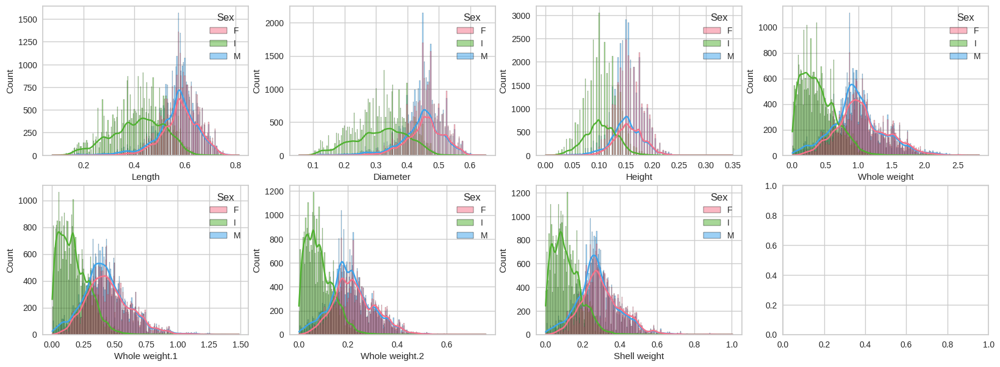

In [20]:
palette = sns.color_palette("husl", 3)

# 성별에 따른 시각화
fig, axs = plt.subplots(2,4, figsize=(20, 7))
for idx, feature in enumerate(feature for feature in train.columns if feature not in ["Rings", "Sex",  'estimated_grate', 'grate_Whole', 'grate_Length']):
  sns.histplot(data=train, x=feature, hue='Sex', kde=True, bins=int(train[feature].size / 400) , ax=axs[idx//4, idx%4], palette=palette)

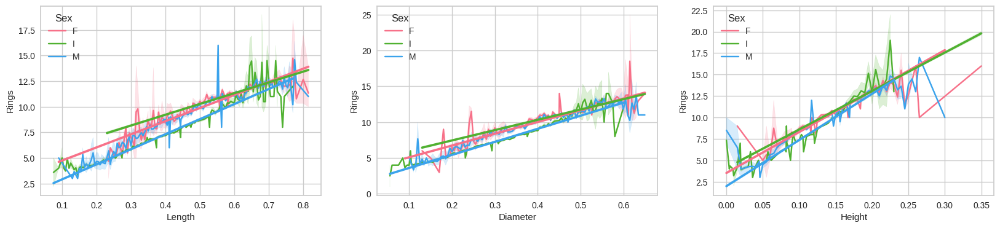

In [21]:
fig, axs = plt.subplots(1, 3, figsize=(20, 4))
colors = ["red", "green", "blue"]
palette = sns.color_palette("husl", 3)
for idx, feature in enumerate(feature for feature in train.columns if feature in ["Length", "Diameter", "Height"]):
  sns.lineplot(data=train, x=feature, y="Rings", hue="Sex", ax=axs[idx], palette=palette)
  sns.regplot(data=train.loc[train.Sex == "M"], x=feature, y="Rings", scatter=False, label="M", ax=axs[idx], color=palette[0])
  sns.regplot(data=train.loc[train.Sex == "F"], x=feature, y="Rings", scatter=False, label="F", ax=axs[idx], color=palette[1])
  sns.regplot(data=train.loc[train.Sex == "I"], x=feature, y="Rings", scatter=False, label="I", ax=axs[idx], color=palette[2])

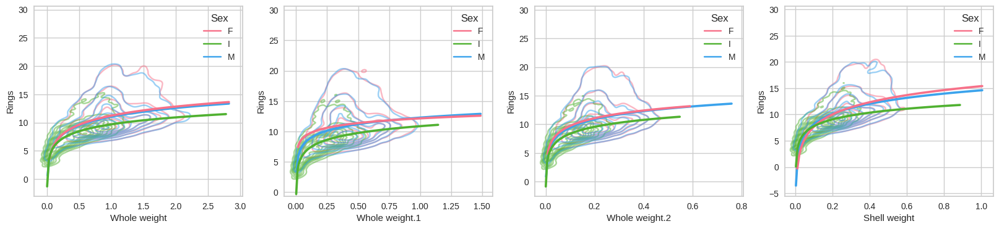

In [22]:
fig, axs = plt.subplots(1, 4, figsize=(20, 4))
palette = sns.color_palette("husl", 3)
for idx, feature in enumerate(feature for feature in train.columns if feature in ["Whole weight", "Whole weight.1", "Whole weight.2", "Shell weight"]):
  sns.kdeplot(data=train, x=feature, y="Rings", hue="Sex", ax=axs[idx], palette=palette, alpha=0.5)
  sns.regplot(data=train.loc[train.Sex == "M"], x=feature, y="Rings", scatter=False, label="M", ax=axs[idx], color=palette[2], logx=True)
  sns.regplot(data=train.loc[train.Sex == "F"], x=feature, y="Rings", scatter=False, label="F", ax=axs[idx], color=palette[0], logx=True)
  sns.regplot(data=train.loc[train.Sex == "I"], x=feature, y="Rings", scatter=False, label="I", ax=axs[idx], color=palette[1], logx=True)

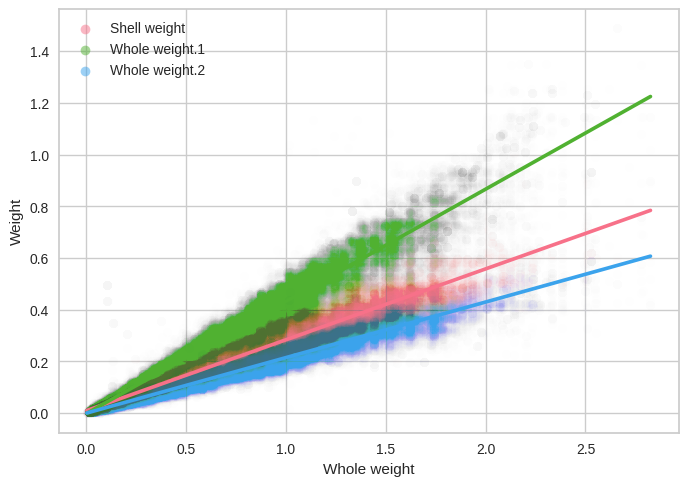

In [23]:
palette = sns.color_palette("husl", 3)

sns.regplot(data=train, x="Whole weight", y="Shell weight", color=palette[0], scatter_kws={"alpha":0.002}, label="Shell weight")
sns.regplot(data=train, x="Whole weight", y="Whole weight.1", color=palette[1], scatter_kws={"alpha":0.002}, label="Whole weight.1")
sns.regplot(data=train, x="Whole weight", y="Whole weight.2", color=palette[2], scatter_kws={"alpha":0.002}, label="Whole weight.2")
plt.ylabel("Weight")
legend = plt.legend()

# 각 범례 항목의 alpha 값을 조절합니다.
for handle in legend.legend_handles:
    handle.set_alpha(0.5)

<Axes: xlabel='Whole weight', ylabel='Rings'>

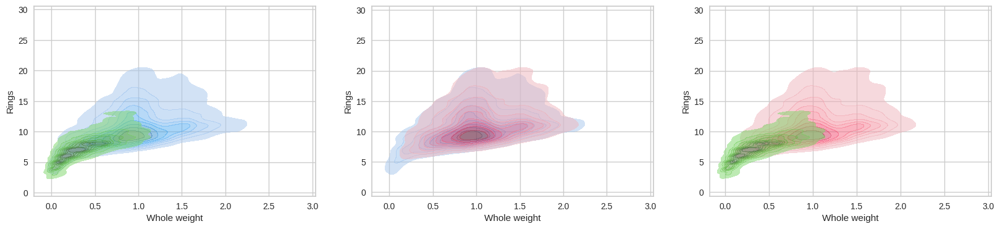

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(20, 4))
palette = sns.color_palette("husl", 3)
M_color = palette[2]
F_color = palette[0]
I_color = palette[1]
# 남 vs 아
sns.kdeplot(data=train.loc[train.Sex == "M"], x="Whole weight", y="Rings", fill=True, alpha = 0.5, label="M", color=M_color, ax=axs[0])
sns.kdeplot(data=train.loc[train.Sex == "I"], x="Whole weight", y="Rings",fill=True, alpha = 0.5, label= "I", color=I_color, ax=axs[0])
# 남 vs 여
sns.kdeplot(data=train.loc[train.Sex == "M"], x="Whole weight", y="Rings", fill=True, alpha = 0.5, label= "M", color=M_color, ax=axs[1])
sns.kdeplot(data=train.loc[train.Sex == "F"], x="Whole weight", y="Rings", fill=True, alpha = 0.5, label= "F", color=F_color, ax=axs[1])
# 여 vs 아
sns.kdeplot(data=train.loc[train.Sex == "F"], x="Whole weight", y="Rings", fill=True, alpha = 0.5, label= "F", color=F_color, ax=axs[2])
sns.kdeplot(data=train.loc[train.Sex == "I"], x="Whole weight", y="Rings", fill=True, alpha = 0.5, label= "I", color=I_color, ax=axs[2])

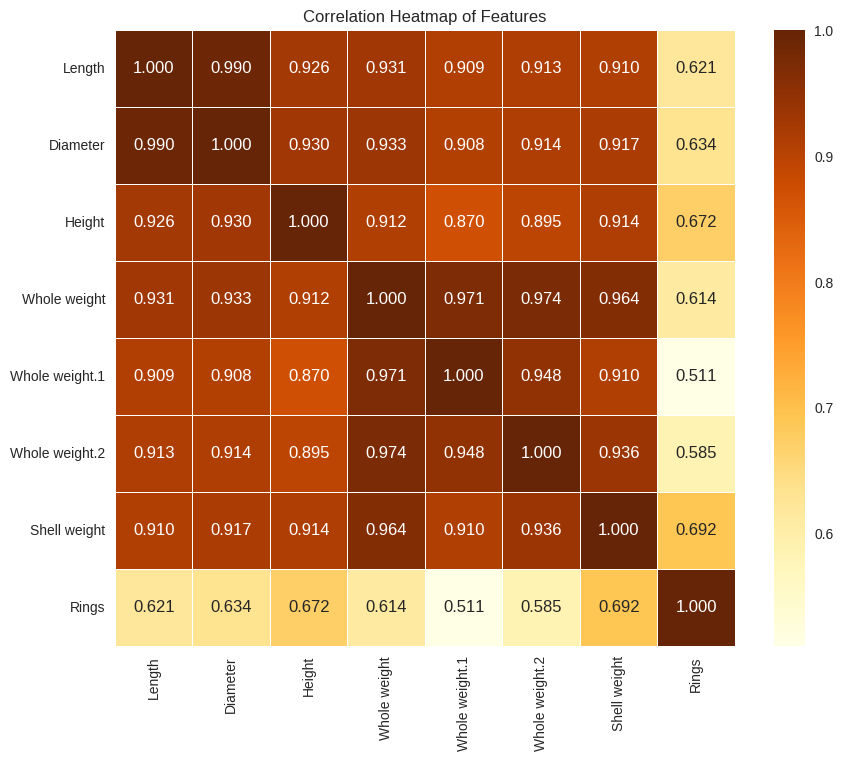

In [27]:
corr_matrix = train.drop(["Sex"], axis=1).corr()

# 히트맵 그리기
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap="YlOrBr", fmt=".3f", linewidths=0.5)
plt.title("Correlation Heatmap of Features")
plt.show()

In [28]:
#  estimated_grate
train["estimated_grate"] = ( train["Whole weight.1"] + train["Whole weight.2"] ) / ( train["Shell weight"]  + train["Whole weight.1"] + train["Whole weight.2"] )
train["estimated_grate"] = train["estimated_grate"] / train["estimated_grate"].mean() #  정규화

train["grate_Whole"] = train["Whole weight"] / train["Rings"]
train["grate_Length"] = train["Length"] / train["Rings"]

<Axes: xlabel='estimated_grate', ylabel='grate_Whole'>

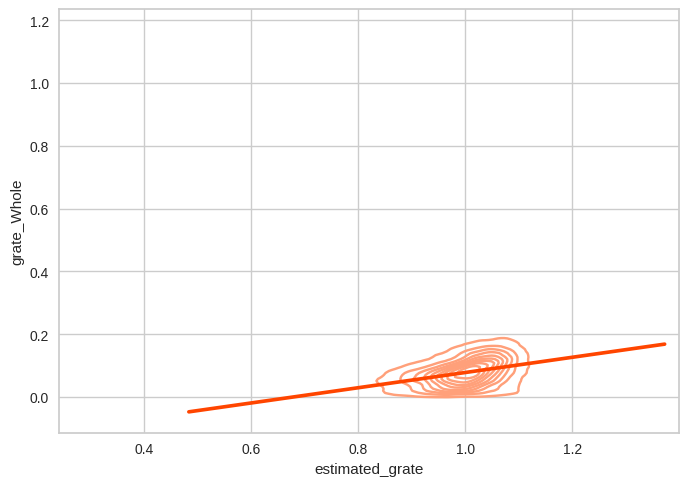

In [29]:
sns.kdeplot(data=train, x="estimated_grate", y="grate_Whole", color="lightsalmon", thresh=0.05)
sns.regplot(data=train.loc[train.estimated_grate > 0.4], x="estimated_grate", y="grate_Whole", scatter=False, color="orangered")

<Axes: xlabel='estimated_grate', ylabel='grate_Length'>

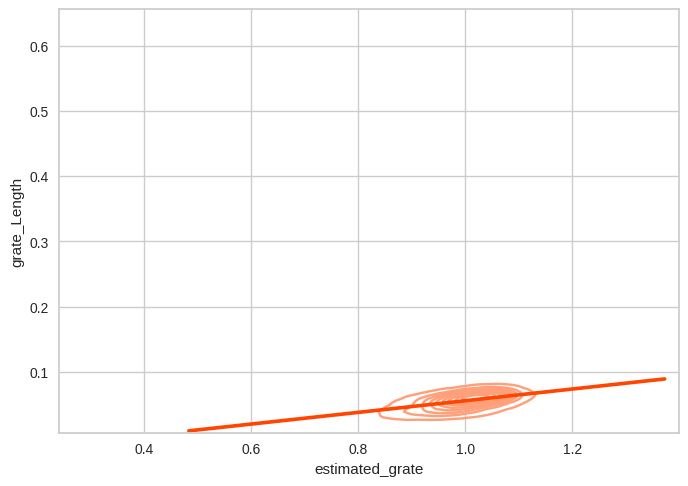

In [30]:
sns.kdeplot(data=train, x="estimated_grate", y="grate_Length", color="lightsalmon", thresh=0.05)
sns.regplot(data=train.loc[train.estimated_grate > 0.4], x="estimated_grate", y="grate_Length", scatter=False, color="orangered")

(0.0, 0.15)

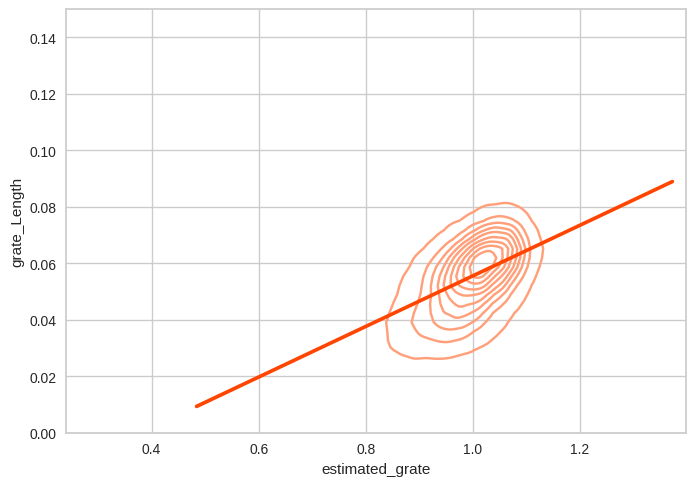

In [31]:
sns.kdeplot(data=train, x="estimated_grate", y="grate_Length", color="lightsalmon", thresh=0.05)
sns.regplot(data=train.loc[train.estimated_grate > 0.4], x="estimated_grate", y="grate_Length", scatter=False, color="orangered")
plt.ylim(0,0.15)

# 피처 엔지니어링

In [11]:
# BMI 피처 추가 생성 -> 이유 : Whole weight를 더 세분화 가능할듯 싶어서?
# 사람의 경우에도 연령대별로 BMI 분포가 다름. https://www.index.go.kr/unify/idx-info.do?idxCd=8021
train_df['BMI'] = train_df['Whole weight'] / (train_df['Length'])**2

test_df['BMI'] = test_df['Whole weight'] / (test_df['Length'])**2

# 크기 [length* diameter] 컬럼 추가
train_df['size'] = train_df['Length'] * train_df['Diameter']
test_df['size'] = test_df['Length'] * test_df['Diameter']

# 크기 [length* diameter] 컬럼 추가
train_df['estimated_grate'] = ( train_df['Whole weight.1'] + train_df['Whole weight.2'] ) / ( train_df['Whole weight.1'] + train_df['Whole weight.2'] + train_df['Shell weight'] )
test_df['estimated_grate'] = ( test_df['Whole weight.1'] + test_df['Whole weight.2'] ) / ( test_df['Whole weight.1'] + test_df['Whole weight.2'] + test_df['Shell weight'] )

In [12]:
train_df.head(2)

,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings,BMI,size,estimated_grate
0,F,0.55,0.43,0.150,0.7715,0.3285,0.1465,0.24,11,2.550413,0.2365,0.664336
1,F,0.63,0.49,0.145,1.1300,0.4580,0.2765,0.32,11,2.847065,0.3087,0.696539


In [13]:
test_df.head(2)

,Sex,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,BMI,size,estimated_grate
id,,,,,,,,,,,
90615,M,0.645,0.475,0.155,1.238,0.6185,0.3125,0.3005,2.975783,0.306375,0.755989
90616,M,0.580,0.460,0.160,0.983,0.4785,0.2195,0.2750,2.922117,0.266800,0.717369


In [14]:
# 'Sex' 컬럼을 원-핫 인코딩하여 더미 변수 생성
train_df = pd.get_dummies(train_df, columns=['Sex'], dtype=int)
test_df = pd.get_dummies(test_df, columns=['Sex'], dtype=int)

In [15]:
# Robustscaler 객체 생성
scaler = RobustScaler()

# train_df 연속형 변수에 대해 표준화 수행
train_df[['Length','Diameter','Height','Whole weight',
              'Whole weight.1','Whole weight.2','Shell weight','BMI', 'size', 'estimated_grate']] = scaler.fit_transform(train_df[['Length','Diameter','Height',
                                                                                                      'Whole weight','Whole weight.1',
                                                                                                      'Whole weight.2','Shell weight','BMI','size', 'estimated_grate']])
# test_df 연속형 변수에 대해 표준화 수행
test_df[['Length','Diameter','Height','Whole weight',
              'Whole weight.1','Whole weight.2','Shell weight','BMI', 'size', 'estimated_grate']] = scaler.fit_transform(test_df[['Length','Diameter','Height',
                                                                                                      'Whole weight','Whole weight.1',
                                                                                                      'Whole weight.2','Shell weight','BMI','size', 'estimated_grate']])

# 모델학습

## 단일모델

In [16]:
# 타겟 변수에 로그 변환 적용
train_df['Rings_log'] = np.log1p(train_df['Rings'])

# 독립 변수와 타겟 변수 분리
X = train_df.drop(columns=['Rings', 'Rings_log'])
y = train_df['Rings_log']

# Train 데이터를 Train과 Validation으로 나눔
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)


### Linear Regression

In [38]:
# Linear Regression 모델 생성
lr_model = LinearRegression()

# 모델 학습
lr_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred = lr_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_actual = np.expm1(y_pred)
y_val_actual = np.expm1(y_val)

# RMSLE 계산
rmsle = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_actual))
print("RMSLE (Linear Regression):", rmsle)

RMSLE (Linear Regression): 0.15985769320162185


### Lasso Regression

In [39]:
# Lasso Regression 모델 생성
lasso_model = Lasso(alpha=0.00001)  # 알파 값은 규제 강도를 조절함.(작을수록 강한 규제)

# 모델 학습
lasso_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred_lasso = lasso_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_lasso_actual = np.expm1(y_pred_lasso)

# RMSLE 계산
rmsle_lasso = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_lasso_actual))
print("RMSLE (Lasso Regression):", rmsle_lasso)

RMSLE (Lasso Regression): 0.1598413399514508


### Ridge Regression

In [40]:
# Ridge Regression 모델 생성
ridge_model = Ridge(alpha=1.0)  # 알파 값은 규제 강도를 조절함(기본값은 1.0)

# 모델 학습
ridge_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred_ridge = ridge_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_ridge_actual = np.expm1(y_pred_ridge)

# RMSLE 계산
rmsle_ridge = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_ridge_actual))
print("RMSLE (Ridge Regression):", rmsle_ridge)

RMSLE (Ridge Regression): 0.15985378351752222


### RandomForest

In [41]:
# Random Forest 모델 생성
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # n_estimators는 트리의 개수

# 모델 학습
rf_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred_rf = rf_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_rf_actual = np.expm1(y_pred_rf)

# RMSLE 계산
rmsle_rf = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_rf_actual))
print("RMSLE (Random Forest):", rmsle_rf)

RMSLE (Random Forest): 0.15429864499856558


### Gradient boosting

In [42]:
# Gradient Boosting 모델 생성
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)

# 모델 학습
gb_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred_gb = gb_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_gb_actual = np.expm1(y_pred_gb)

# RMSLE 계산
rmsle_gb = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_gb_actual))
print("RMSLE (Gradient Boosting):", rmsle_gb)

RMSLE (Gradient Boosting): 0.15420490575097526


### XGBoost

In [43]:
# XGBoost 모델 생성
xgb_model = XGBRegressor(n_estimators=100, random_state=42)

# 모델 학습
xgb_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred_xgb = xgb_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_xgb_actual = np.expm1(y_pred_xgb)

# RMSLE 계산
rmsle_xgb = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_xgb_actual))
print("RMSLE (XGBoost):", rmsle_xgb)

RMSLE (XGBoost): 0.15197607533224947


### LightGBM

In [44]:
# LightGBM 모델 생성
lgbm_model = LGBMRegressor(n_estimators=100, random_state=42)

# 모델 학습
lgbm_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred_lgbm = lgbm_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_lgbm_actual = np.expm1(y_pred_lgbm)

# RMSLE 계산
rmsle_lgbm = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_lgbm_actual))
print("RMSLE (LightGBM):", rmsle_lgbm)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012152 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
RMSLE (LightGBM): 0.15158528834231721


### Catboost

In [45]:
# CatBoost 모델 생성
catboost_model = CatBoostRegressor(n_estimators=100, random_state=42, verbose=0)

# 모델 학습
catboost_model.fit(X_train, y_train)

# Validation 데이터에 대한 예측값 계산
y_pred_catboost = catboost_model.predict(X_val)

# 예측값에 지수 함수(exp)를 취하여 원래 스케일로 되돌림
y_pred_catboost_actual = np.expm1(y_pred_catboost)

# RMSLE 계산
rmsle_catboost = np.sqrt(mean_squared_log_error(y_val_actual, y_pred_catboost_actual))
print("RMSLE (CatBoost):", rmsle_catboost)

RMSLE (CatBoost): 0.15181522831077787


### 모델별 RMSLE값 비교

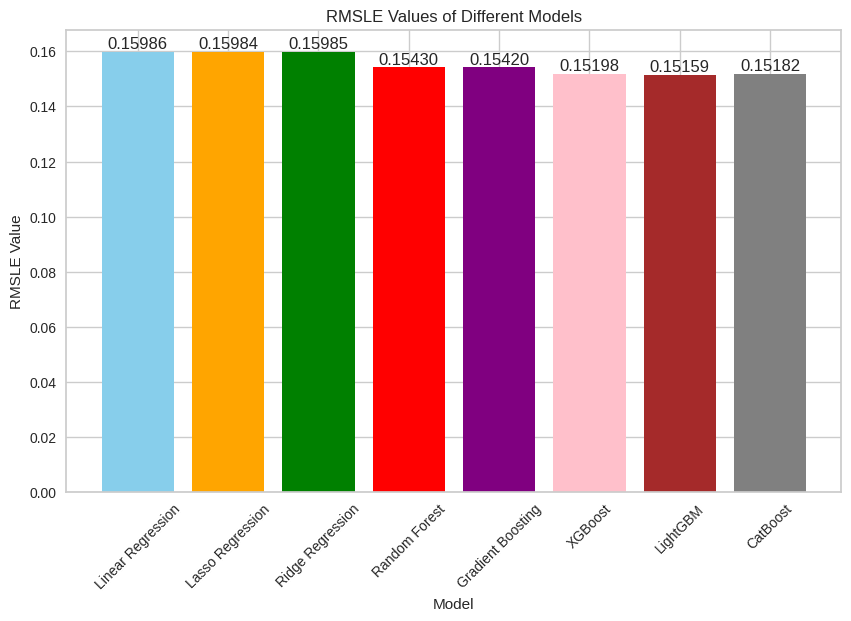

In [46]:
# 각 모델의 이름과 RMSLE 값
models = ['Linear Regression', 'Lasso Regression', 'Ridge Regression', 'Random Forest', 'Gradient Boosting', 'XGBoost', 'LightGBM', 'CatBoost']
rmsle_values = [rmsle, rmsle_lasso, rmsle_ridge, rmsle_rf, rmsle_gb, rmsle_xgb, rmsle_lgbm, rmsle_catboost]

# 막대 색상 설정
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'pink', 'brown', 'gray']

# 막대 그래프 그리기
plt.figure(figsize=(10, 6))
bars = plt.bar(models, rmsle_values, color=colors)

# 각 막대 상단에 수치값 표시 (소수점 다섯 자리까지)
for bar, value in zip(bars, rmsle_values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), '{:.5f}'.format(value), ha='center', va='bottom')

plt.xlabel('Model')
plt.ylabel('RMSLE Value')
plt.title('RMSLE Values of Different Models')
plt.xticks(rotation=45)
plt.show()

## 최종모델 (XGBoost, LightGBM, CatBoost)

In [17]:
train_df.head(2)

,Length,Diameter,Height,Whole weight,Whole weight.1,Whole weight.2,Shell weight,Rings,BMI,size,estimated_grate,Sex_F,Sex_I,Sex_M,Rings_log
0,0.032258,0.04,0.2,-0.042879,-0.005226,-0.133106,0.081081,11,-0.084917,0.058372,-0.551403,1,0,0,2.484907
1,0.548387,0.52,0.1,0.506126,0.445993,0.754266,0.513514,11,0.226566,0.612903,0.078632,1,0,0,2.484907


In [18]:
X_train = train_df.drop(['Rings','Rings_log'],axis=1)
y_train = train_df['Rings']
X_test = test_df

In [19]:
def rmsle(y_true, y_pred):
    return np.sqrt(mean_squared_log_error(y_true, y_pred))

### 하이퍼 파라미터 튜닝 + KFold + Voting

In [20]:
# LightGBM 모델을 최적화하는 함수
def optimize_lgb(trial: Trial):
    # LightGBM 모델 파라미터
    params = {
        'objective': 'regression',
        'metric': 'rmse',
        'device': 'cpu',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'random_state': 42,
        'num_leaves': trial.suggest_int('num_leaves', 20, 100),  # Leaf 노드의 최대 수 범위 설정
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),  # 학습률 범위 설정
        'max_depth': trial.suggest_int('max_depth', 4, 12),  # 트리의 최대 깊이 범위 설정
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),  # 최소 샘플 수 범위 설정
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 0.1),  # L1 정규화 강도 범위 설정
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 0.1),  # L2 정규화 강도 범위 설정
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),  # 데이터 샘플링 비율 범위 설정
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),  # 각 트리에서 피처 사용 비율 범위 설정
        'n_estimators': trial.suggest_int('n_estimators', 100, 1500),  # Estimators 수 범위 설정
    }

    # 교차 검증을 위한 KFold 설정
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = []

    # 교차 검증 반복
    for fold, (train_indices, valid_indices) in enumerate(kf.split(X_train, y_train)):
        X_train_fold, X_valid_fold = X_train.iloc[train_indices], X_train.iloc[valid_indices]
        y_train_fold, y_valid_fold = np.log1p(y_train.iloc[train_indices]), np.log1p(y_train.iloc[valid_indices])

        # 모델 훈련
        model = LGBMRegressor(**params)
        model.fit(X_train_fold, y_train_fold)

        # 검증 데이터에 대한 RMSLE 계산
        valid_pred = model.predict(X_valid_fold)
        valid_pred = np.expm1(valid_pred)  # 로그 스케일을 원래 척도로 변환
        cv_score = rmsle(np.expm1(y_valid_fold), valid_pred)
        cv_scores.append(cv_score)

    # 폴드별 평균 RMSLE 반환
    return np.mean(cv_scores)

In [21]:
# CatBoost 모델을 최적화하는 함수
def optimize_cat(trial: Trial):
    # CatBoost 모델 파라미터
    params = {
        'loss_function': 'RMSE',
        'eval_metric': 'RMSE',
        'task_type': 'CPU',
        'random_seed': 42,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),  # 학습률 범위 설정
        'depth': trial.suggest_int('depth', 4, 12),  # 트리 깊이 범위 설정
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 0, 1),  # L2 정규화 강도 범위 설정
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.1, 1.0),  # 배깅 온도 범위 설정
        'border_count': trial.suggest_int('border_count', 32, 255),  # 경계 세기 범위 설정
        'iterations': trial.suggest_int('iterations', 100, 1500),  # Iterations 수 범위 설정
        'grow_policy': 'Depthwise',
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 100),  # 잎사귀 노드에 필요한 최소 데이터 수 범위 설정
    }

    # 교차 검증을 위한 KFold 설정
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = []

    # 교차 검증 반복
    for fold, (train_indices, valid_indices) in enumerate(kf.split(X_train, y_train)):
        X_train_fold, X_valid_fold = X_train.iloc[train_indices], X_train.iloc[valid_indices]
        y_train_fold, y_valid_fold = np.log1p(y_train.iloc[train_indices]), np.log1p(y_train.iloc[valid_indices])

        # 모델 훈련
        model = CatBoostRegressor( **params, silent=True)
        model.fit(X_train_fold, y_train_fold)

        # 검증 데이터에 대한 RMSLE 계산
        valid_pred = model.predict(X_valid_fold)
        valid_pred = np.expm1(valid_pred)
        cv_score = rmsle(np.expm1(y_valid_fold), valid_pred)
        cv_scores.append(cv_score)

    # 폴드별 평균 RMSLE 반환
    return np.mean(cv_scores)

In [52]:
# Optuna를 사용한 매개변수 최적화 스터디
lgb_study = optuna.create_study(direction='minimize', sampler=TPESampler())

# 25번 시도을 통한 매개변수 최적화
lgb_study.optimize(optimize_lgb, n_trials=25)

# 최적의 lgbm 매개변수 얻기
lgb_params = lgb_study.best_params

print("Optimized LightGBM Parameters:", lgb_params)

[I 2024-04-25 02:25:34,442] A new study created in memory with name: no-name-183132a1-411e-445e-b797-2ffc19092405
[I 2024-04-25 02:26:24,625] Trial 0 finished with value: 0.14899457034636468 and parameters: {'num_leaves': 46, 'learning_rate': 0.028694607402777232, 'max_depth': 8, 'min_child_samples': 96, 'reg_alpha': 0.09794911122763221, 'reg_lambda': 0.0025722222156333353, 'subsample': 0.7199508109911841, 'colsample_bytree': 0.8056054257365555, 'n_estimators': 1274}. Best is trial 0 with value: 0.14899457034636468.
[I 2024-04-25 02:26:41,733] Trial 1 finished with value: 0.1492018380744818 and parameters: {'num_leaves': 78, 'learning_rate': 0.06672228886445226, 'max_depth': 11, 'min_child_samples': 31, 'reg_alpha': 0.08800827802038164, 'reg_lambda': 0.028368441063130426, 'subsample': 0.9745305446548735, 'colsample_bytree': 0.6614598237720701, 'n_estimators': 377}. Best is trial 0 with value: 0.14899457034636468.
[I 2024-04-25 02:26:52,735] Trial 2 finished with value: 0.14958682304494

Optimized LightGBM Parameters: {'num_leaves': 49, 'learning_rate': 0.046218614977196044, 'max_depth': 9, 'min_child_samples': 90, 'reg_alpha': 0.039727337419094226, 'reg_lambda': 0.0004668331593567046, 'subsample': 0.5612306645779248, 'colsample_bytree': 0.5310292787330371, 'n_estimators': 807}


In [53]:
# Optuna를 사용한 매개변수 최적화 스터디
cat_study = optuna.create_study(direction='minimize', sampler=TPESampler())

# 25번 시도을 통한 매개변수 최적화
cat_study.optimize(optimize_cat, n_trials=25)

# 최적의 catboost 매개변수 얻기
cat_params = cat_study.best_params

print("Optimized CatBoost Parameters:", cat_params)

[I 2024-04-25 02:38:39,631] A new study created in memory with name: no-name-c8d8d1d5-6206-4850-88d9-14d5105563d1
[I 2024-04-25 02:42:11,173] Trial 0 finished with value: 0.1540729653297109 and parameters: {'learning_rate': 0.18267500186414715, 'depth': 9, 'l2_leaf_reg': 0.3870963085401422, 'bagging_temperature': 0.6084670390316889, 'border_count': 198, 'iterations': 917, 'min_data_in_leaf': 70}. Best is trial 0 with value: 0.1540729653297109.
[I 2024-04-25 02:45:25,978] Trial 1 finished with value: 0.14976844155155142 and parameters: {'learning_rate': 0.026748025935091797, 'depth': 9, 'l2_leaf_reg': 0.7196750533721578, 'bagging_temperature': 0.15647946761101353, 'border_count': 195, 'iterations': 597, 'min_data_in_leaf': 2}. Best is trial 1 with value: 0.14976844155155142.
[I 2024-04-25 02:49:25,130] Trial 2 finished with value: 0.15654161097103514 and parameters: {'learning_rate': 0.15632803561481123, 'depth': 11, 'l2_leaf_reg': 0.47034521817864094, 'bagging_temperature': 0.635748534

Optimized CatBoost Parameters: {'learning_rate': 0.03434917047408577, 'depth': 9, 'l2_leaf_reg': 0.7252583305228849, 'bagging_temperature': 0.4939566320336446, 'border_count': 185, 'iterations': 618, 'min_data_in_leaf': 11}


In [23]:
# Optuna의 objective 함수 정의
def objective(trial):
    # 앙상블에 대한 샘플 가중치
    weights = [
        trial.suggest_float("weight_lgbm", 0, 1),
        trial.suggest_float("weight_catboost", 0, 1)
    ]

    # 가중치의 합이 1이 되도록 정규화
    total_weight = sum(weights)
    normalized_weights = [w / total_weight for w in weights]

    # 현재 가중치로 VotingRegressor 정의
    estimators = [
        ('lgbm', LGBMRegressor(**lgb_params)),
        ('catboost', CatBoostRegressor(**cat_params, silent=True))
    ]

    voting_regressor = VotingRegressor(estimators=estimators, weights=normalized_weights)

    # 교차 검증 객체 초기화
    kf = KFold(n_splits=5, shuffle=True, random_state=42)

    # 교차 검증을 통해 모델 훈련 및 평가
    cv_scores = []
    for fold, (train_indices, valid_indices) in enumerate(kf.split(X_train, y_train)):
        X_train_fold = X_train.iloc[train_indices]
        y_train_fold = np.log1p(y_train.iloc[train_indices])

        X_valid_fold = X_train.iloc[valid_indices]
        y_valid_fold = np.log1p(y_train.iloc[valid_indices])

        # 현재 가중치로 모델 훈련
        voting_regressor.fit(X_train_fold, y_train_fold)

        # 검증 데이터에 대한 예측 및 RMSLE 점수 계산
        valid_pred = voting_regressor.predict(X_valid_fold)
        valid_pred = np.expm1(valid_pred)  # 원래 척도로 변환

        # 이 폴드의 RMSLE 계산 및 cv_scores에 추가
        cv_score = rmsle(np.expm1(y_valid_fold), valid_pred)  # 원래 척도로 y_valid_fold 변환
        cv_scores.append(cv_score)

    # 모든 폴드의 평균 RMSLE 반환
    return np.mean(cv_scores)

# Optuna 스터디 설정
study = optuna.create_study(direction='minimize')  # RMSLE를 최소화
study.optimize(objective, n_trials=50)  # 필요한 트라이얼 수 설정

# 가중치를 1로 정규화하여 합이 1이 되도록 함
total_weight = sum(study.best_params.values())
best_weights = [value / total_weight for value in study.best_params.values()]
print("최적 RMSLE:", study.best_value)
print("최적 가중치:", best_weights)

[I 2024-04-25 06:07:11,996] A new study created in memory with name: no-name-05350b81-08b3-4d51-b083-36a3afd2ab79


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015605 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-04-25 06:09:20,199] Trial 0 finished with value: 0.1488443830274265 and parameters: {'weight_lgbm': 0.8364413163168943, 'weight_catboost': 0.17612915180011102}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:11:21,642] Trial 1 finished with value: 0.14916875056917264 and parameters: {'weight_lgbm': 0.600661821039079, 'weight_catboost': 0.6876862916348613}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:13:18,321] Trial 2 finished with value: 0.14884469607115747 and parameters: {'weight_lgbm': 0.8980960064742521, 'weight_catboost': 0.19338088650694218}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:15:16,200] Trial 3 finished with value: 0.1499090136522431 and parameters: {'weight_lgbm': 0.1586885220531581, 'weight_catboost': 0.8465194879635831}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:17:15,525] Trial 4 finished with value: 0.14887939154769828 and parameters: {'weight_lgbm': 0.9806019367671618, 'weight_catboost': 0.02829420149620543}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:19:12,494] Trial 5 finished with value: 0.1500147565114579 and parameters: {'weight_lgbm': 0.1367449024485946, 'weight_catboost': 0.9624338093779167}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007951 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:21:19,807] Trial 6 finished with value: 0.1489768775408042 and parameters: {'weight_lgbm': 0.902997896543866, 'weight_catboost': 0.5949129127155783}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:23:17,342] Trial 7 finished with value: 0.14947596318667067 and parameters: {'weight_lgbm': 0.45828419173744317, 'weight_catboost': 0.9911010282524948}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:25:15,088] Trial 8 finished with value: 0.14922439513377334 and parameters: {'weight_lgbm': 0.6360507183801941, 'weight_catboost': 0.8261565194202646}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007612 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:27:13,761] Trial 9 finished with value: 0.14996203613070502 and parameters: {'weight_lgbm': 0.11796280327102648, 'weight_catboost': 0.7192881152922144}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010770 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:29:11,955] Trial 10 finished with value: 0.1488899166381509 and parameters: {'weight_lgbm': 0.7794507430470567, 'weight_catboost': 0.3300520223107195}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:31:08,916] Trial 11 finished with value: 0.14886318012949198 and parameters: {'weight_lgbm': 0.7613094859711397, 'weight_catboost': 0.2503527830723548}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007904 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:33:06,520] Trial 12 finished with value: 0.14888297498579361 and parameters: {'weight_lgbm': 0.3551663296691287, 'weight_catboost': 0.007952720047503414}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:35:04,847] Trial 13 finished with value: 0.14885164470872417 and parameters: {'weight_lgbm': 0.8368136524798591, 'weight_catboost': 0.22807716045290516}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013744 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:37:02,976] Trial 14 finished with value: 0.14896113915310272 and parameters: {'weight_lgbm': 0.6819949102992519, 'weight_catboost': 0.422211811356593}. Best is trial 0 with value: 0.1488443830274265.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008295 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:39:00,531] Trial 15 finished with value: 0.1488442305360171 and parameters: {'weight_lgbm': 0.9761229747419229, 'weight_catboost': 0.15373316922174582}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:40:58,344] Trial 16 finished with value: 0.14885609157268592 and parameters: {'weight_lgbm': 0.9932711002456691, 'weight_catboost': 0.08570875346233794}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:43:00,779] Trial 17 finished with value: 0.1490628779789968 and parameters: {'weight_lgbm': 0.5019635807130503, 'weight_catboost': 0.43780372139265866}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007901 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:45:02,105] Trial 18 finished with value: 0.15042549597714336 and parameters: {'weight_lgbm': 0.0008781696909579972, 'weight_catboost': 0.1279735128862397}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007663 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:47:04,763] Trial 19 finished with value: 0.1489017716884904 and parameters: {'weight_lgbm': 0.7256230712081285, 'weight_catboost': 0.33328935326869535}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2024-04-25 06:49:06,327] Trial 20 finished with value: 0.14887577491286674 and parameters: {'weight_lgbm': 0.8588457274612425, 'weight_catboost': 0.3235830140722465}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:51:07,902] Trial 21 finished with value: 0.14884441757269604 and parameters: {'weight_lgbm': 0.9248347807386934, 'weight_catboost': 0.19525999364748658}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007582 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:53:06,026] Trial 22 finished with value: 0.14884481735821545 and parameters: {'weight_lgbm': 0.9961478497003265, 'weight_catboost': 0.14873787244418768}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007712 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:55:05,354] Trial 23 finished with value: 0.14885600360009715 and parameters: {'weight_lgbm': 0.9150964904302609, 'weight_catboost': 0.27107355452363924}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:57:05,670] Trial 24 finished with value: 0.14896816098820514 and parameters: {'weight_lgbm': 0.80717105694471, 'weight_catboost': 0.514073044610478}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007693 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 06:59:03,776] Trial 25 finished with value: 0.14884601284332075 and parameters: {'weight_lgbm': 0.5309321892243207, 'weight_catboost': 0.0728970286732552}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007378 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:01:03,334] Trial 26 finished with value: 0.14891367281015894 and parameters: {'weight_lgbm': 0.3495188110491931, 'weight_catboost': 0.1724556712063302}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:03:04,936] Trial 27 finished with value: 0.14889891435047753 and parameters: {'weight_lgbm': 0.9196746212161817, 'weight_catboost': 0.4146542124756588}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007881 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:05:03,640] Trial 28 finished with value: 0.14884451901244106 and parameters: {'weight_lgbm': 0.68602819592447, 'weight_catboost': 0.10507270667308755}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007801 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:07:04,809] Trial 29 finished with value: 0.148957118970359 and parameters: {'weight_lgbm': 0.8368181784027775, 'weight_catboost': 0.5094820882039952}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:09:04,630] Trial 30 finished with value: 0.14891914930839042 and parameters: {'weight_lgbm': 0.5624933192617685, 'weight_catboost': 0.2860941486376713}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:11:04,763] Trial 31 finished with value: 0.14884505056754108 and parameters: {'weight_lgbm': 0.6951812272266125, 'weight_catboost': 0.10192456968608135}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008068 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:13:07,587] Trial 32 finished with value: 0.14885899248352635 and parameters: {'weight_lgbm': 0.6405270743446885, 'weight_catboost': 0.1988958819006299}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:15:08,574] Trial 33 finished with value: 0.14889651911819707 and parameters: {'weight_lgbm': 0.9480773223306969, 'weight_catboost': 0.00084317066638466}. Best is trial 15 with value: 0.1488442305360171.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007969 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:17:15,962] Trial 34 finished with value: 0.1488441309625894 and parameters: {'weight_lgbm': 0.8554325933464176, 'weight_catboost': 0.1763214589337806}. Best is trial 34 with value: 0.1488441309625894.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:19:17,970] Trial 35 finished with value: 0.14884570584443263 and parameters: {'weight_lgbm': 0.8796576356202882, 'weight_catboost': 0.20020526615502326}. Best is trial 34 with value: 0.1488441309625894.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:21:28,882] Trial 36 finished with value: 0.1488825888177858 and parameters: {'weight_lgbm': 0.9393662837106985, 'weight_catboost': 0.37567392302963265}. Best is trial 34 with value: 0.1488441309625894.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012767 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:23:36,975] Trial 37 finished with value: 0.14886204993895547 and parameters: {'weight_lgbm': 0.8328117565780161, 'weight_catboost': 0.056447916473817764}. Best is trial 34 with value: 0.1488441309625894.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:25:42,176] Trial 38 finished with value: 0.14884482947341637 and parameters: {'weight_lgbm': 0.7657305008274642, 'weight_catboost': 0.16629169444709668}. Best is trial 34 with value: 0.1488441309625894.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008657 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:27:45,438] Trial 39 finished with value: 0.14901364411599533 and parameters: {'weight_lgbm': 0.8745264372741177, 'weight_catboost': 0.6560791625702427}. Best is trial 34 with value: 0.1488441309625894.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:29:47,204] Trial 40 finished with value: 0.14884734785612302 and parameters: {'weight_lgbm': 0.9539631706204965, 'weight_catboost': 0.23169272240769995}. Best is trial 34 with value: 0.1488441309625894.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007993 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:31:52,329] Trial 41 finished with value: 0.14884378290755404 and parameters: {'weight_lgbm': 0.7384220017591321, 'weight_catboost': 0.12303066975504179}. Best is trial 41 with value: 0.14884378290755404.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007948 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:33:52,473] Trial 42 finished with value: 0.14884372180429606 and parameters: {'weight_lgbm': 0.7871034465090003, 'weight_catboost': 0.13250272658305554}. Best is trial 42 with value: 0.14884372180429606.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:35:56,601] Trial 43 finished with value: 0.14884350087794945 and parameters: {'weight_lgbm': 0.7457971770270575, 'weight_catboost': 0.13759913549740466}. Best is trial 43 with value: 0.14884350087794945.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:37:56,813] Trial 44 finished with value: 0.14885959504118454 and parameters: {'weight_lgbm': 0.615171701251725, 'weight_catboost': 0.04607999841543889}. Best is trial 43 with value: 0.14884350087794945.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:39:59,583] Trial 45 finished with value: 0.148843500149078 and parameters: {'weight_lgbm': 0.7479853261345921, 'weight_catboost': 0.13789695203015606}. Best is trial 45 with value: 0.148843500149078.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:42:01,747] Trial 46 finished with value: 0.148844414313516 and parameters: {'weight_lgbm': 0.7277876510650605, 'weight_catboost': 0.11255167321837425}. Best is trial 45 with value: 0.148843500149078.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:44:04,816] Trial 47 finished with value: 0.14887132989090185 and parameters: {'weight_lgbm': 0.8073976070918102, 'weight_catboost': 0.2912866882326216}. Best is trial 45 with value: 0.148843500149078.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007845 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:46:05,635] Trial 48 finished with value: 0.14885941112713347 and parameters: {'weight_lgbm': 0.38734079619691936, 'weight_catboost': 0.029230666381034304}. Best is trial 45 with value: 0.148843500149078.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

[I 2024-04-25 07:48:08,038] Trial 49 finished with value: 0.14884493311678643 and parameters: {'weight_lgbm': 0.5780503257031738, 'weight_catboost': 0.1263276899345686}. Best is trial 45 with value: 0.148843500149078.


최적 RMSLE: 0.148843500149078
최적 가중치: [0.8443394168400881, 0.155660583159912]


In [24]:
# 앙상블 모델 설정
estimators = [
    ('lgbm', LGBMRegressor(**lgb_params)),
    ('catboost', CatBoostRegressor(**cat_params, silent=True)),
]

# VotingRegressor 초기화
voting_regressor = VotingRegressor(estimators=estimators, weights=best_weights)  # 가중치

test_predictions = np.zeros(X_test.shape[0])
cv_scores = []

# KFold를 사용하여 교차 검증을 수행
kf = KFold(n_splits=5, shuffle=True, random_state=42)
for fold, (train_indices, valid_indices) in enumerate(kf.split(X_train, y_train)):
    print(f"Fold {fold+1}의 모델 훈련")
    X_train_fold, X_valid_fold = X_train.iloc[train_indices], X_train.iloc[valid_indices]
    y_train_fold, y_valid_fold = np.log1p(y_train.iloc[train_indices]), np.log1p(y_train.iloc[valid_indices])

    # 모델 훈련
    voting_regressor.fit(X_train_fold, y_train_fold)

    # 검증 데이터에 대한 예측 및 RMSLE 점수 계산
    valid_pred = voting_regressor.predict(X_valid_fold)
    valid_pred = np.expm1(valid_pred)  # 예측값을 원래 척도로 변환
    cv_score = rmsle(np.expm1(y_valid_fold), valid_pred)  # y_valid_fold를 원래 척도로 변환
    cv_scores.append(cv_score)
    print(f"Fold {fold+1}의 RMSLE: {cv_score}")

    # 테스트 데이터에 대한 예측
    test_pred = np.expm1(voting_regressor.predict(X_test))
    test_predictions += test_pred / kf.n_splits

# 폴드별 RMSLE 점수의 평균 표시
print()
print(f"폴드별 평균 RMSLE: {np.mean(cv_scores)}")

Fold 1의 모델 훈련
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2098
[LightGBM] [Info] Number of data points in the train set: 75833, number of used features: 13
[LightGBM] [Info] Start training from score 2.330406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [25]:
# Create submission file
submission['Rings'] = test_predictions
submission.to_csv('submission.csv', index=False)
submission

,id,Rings
0,90615,9.807450
1,90616,9.700105
2,90617,9.722544
3,90618,10.459408
4,90619,7.587399
...,...,...
60406,151021,6.338415
60407,151022,9.453477
60408,151023,12.239347
60409,151024,13.247499


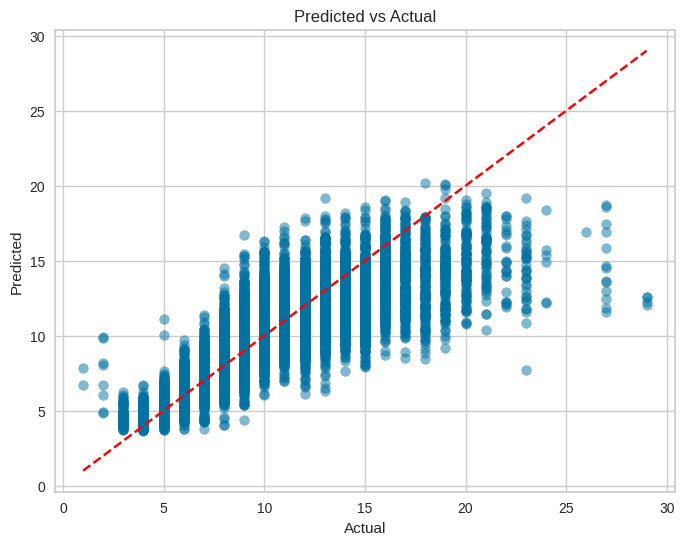

In [26]:
# 예측값과 실제값의 산점도 그리기
plt.figure(figsize=(8, 6))
plt.scatter(np.expm1(y_valid_fold), valid_pred, alpha=0.5)  # 실제값과 예측값을 전달
plt.plot([min(np.expm1(y_valid_fold)), max(np.expm1(y_valid_fold))], [min(np.expm1(y_valid_fold)), max(np.expm1(y_valid_fold))], '--', color='red')  # 대각선 선 추가
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Predicted vs Actual')
plt.grid(True)
plt.show()

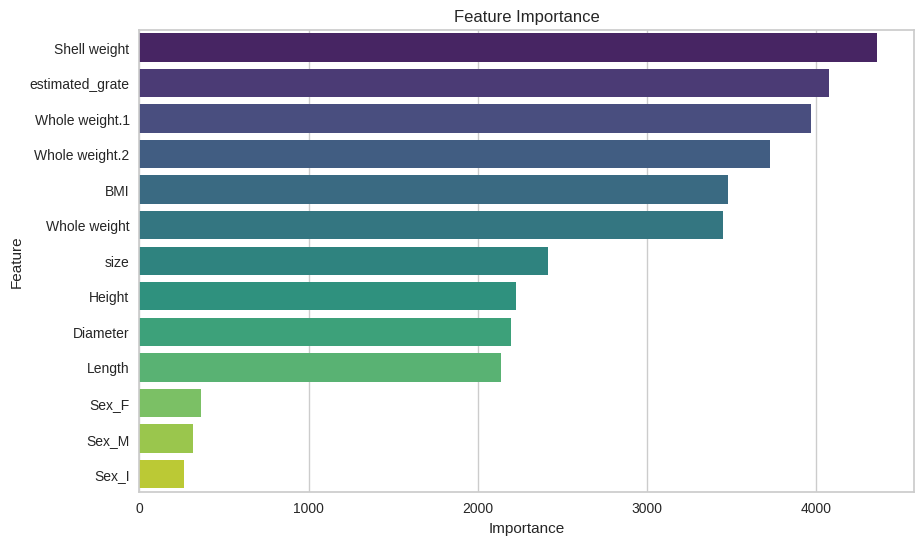

In [27]:
# 각 모델에서 feature importance 가져오기
lgb_feature_importance = voting_regressor.estimators_[0].feature_importances_
cat_feature_importance = voting_regressor.estimators_[1].get_feature_importance()

# 모델별 feature importance를 데이터프레임으로 변환
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'LGBM_Importance': lgb_feature_importance,
    'CatBoost_Importance': cat_feature_importance
})

# 전체적인 중요도 계산 (모델별 중요도의 합)
importance_df['Total_Importance'] = importance_df['LGBM_Importance'] + importance_df['CatBoost_Importance']

# 중요도 기준으로 정렬
importance_df = importance_df.sort_values(by='Total_Importance', ascending=False)

# 시각화
plt.figure(figsize=(10, 6))
sns.barplot(data=importance_df, x='Total_Importance', y='Feature', palette='viridis')
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()